## Final Project Submission

Please fill out:
* Student name: John Harrigan
* Student pace: full time
* Scheduled project review date/time: 10/28/2022 3:00 PM
* Instructor name: Joseph Mata
* Blog post URL: https://jackstechworld.blogspot.com/2022/10/why-i-got-started-in-cs.html


## Overview
By looking at the information for over 20,000 homes in King County WA, it is possible to narrow down the specific factors that have the greatest impact on market price for your average house. Anyone in the business of flipping houses can use this analysis to help choose the right kind of house, and the best renovations, to boost their profits as much as possible

## Business Problem
![house flip](https://habitathunters.com/wp-content/uploads/2018/03/house-flipping.jpg)

This project is designed to help out anyone in the business of flipping houses in the name of profit. Any such business needs to have accurrate data that will tell them the areas of the most undervalued houses, and will tell them the most profitable renovations to be made to those houses. They want to know a specific plan of action for finding, buying, renovating, and selling the homes with the most potential for profit.

## First import all the tools for the job

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, StandardScaler, PolynomialFeatures
from sklearn.metrics import mean_absolute_error, mean_squared_error
from statsmodels.stats.outliers_influence import variance_inflation_factor
import datetime as dt
from scipy import stats

## Next we Read in the Data
This is housing data from kaggle

In [2]:
df = pd.read_csv('./data/kc_house_data.csv')
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,NONE,...,7 Average,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,NO,NONE,...,7 Average,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,NO,NONE,...,6 Low Average,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,NO,NONE,...,7 Average,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,NO,NONE,...,8 Good,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503


## Dealing With Empty Values
I deceided to fill in the missing values with the negative equivalents under the assumption that any missing values where unimportant. Such as failing to put a rating for the view because the house did not have a view worth mentioning, or a missing value in the year renovated because there was no renovation to speak of.

In [3]:
df.isna().sum()

id                  0
date                0
price               0
bedrooms            0
bathrooms           0
sqft_living         0
sqft_lot            0
floors              0
waterfront       2376
view               63
condition           0
grade               0
sqft_above          0
sqft_basement       0
yr_built            0
yr_renovated     3842
zipcode             0
lat                 0
long                0
sqft_living15       0
sqft_lot15          0
dtype: int64

In [4]:
df['view'] = df['view'].fillna('NONE')
df['waterfront'] =df['waterfront'].fillna('NO')
df['yr_renovated'] = df['yr_renovated'].fillna(0.0)

## Dealing With Values of the Wrong Type and Values We Don't Need
Here I converted the sqft_basement into an int value and removed the placeholders for missing values. I dropped the unique ID for the houses because there was little need to specify any one house amoung the thousands. I converted the date to datetime for the sake of useability, and I converted the renovation column to 'yes' 'no' binary to eliminate the confusion for the linear regression model.

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     21597 non-null  object 
 9   view           21597 non-null  object 
 10  condition      21597 non-null  object 
 11  grade          21597 non-null  object 
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  object 
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   21597 non-null  float64
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

In [6]:
df = df.drop('id', axis = 1)
df.sqft_basement = df.sqft_basement.str.replace('?', '0.0', regex = True)
df.sqft_basement = df.sqft_basement.astype('float64')
df['date'] = pd.to_datetime(df.date)
df['yr_renovated'] = df['yr_renovated'].map(lambda x: 0 if x == 0.0 else 1)

# Checking for Outliers
when going through this process I wanted to keep some of the higher outliers because these represented houses that were very highly priced. These houses will contain valuable information about which factors are the most valuable in determining the market price for a house. Because of this I kept some of the outliers and got rid of the truely ridiculous homes that must have been mansions.

<AxesSubplot:>

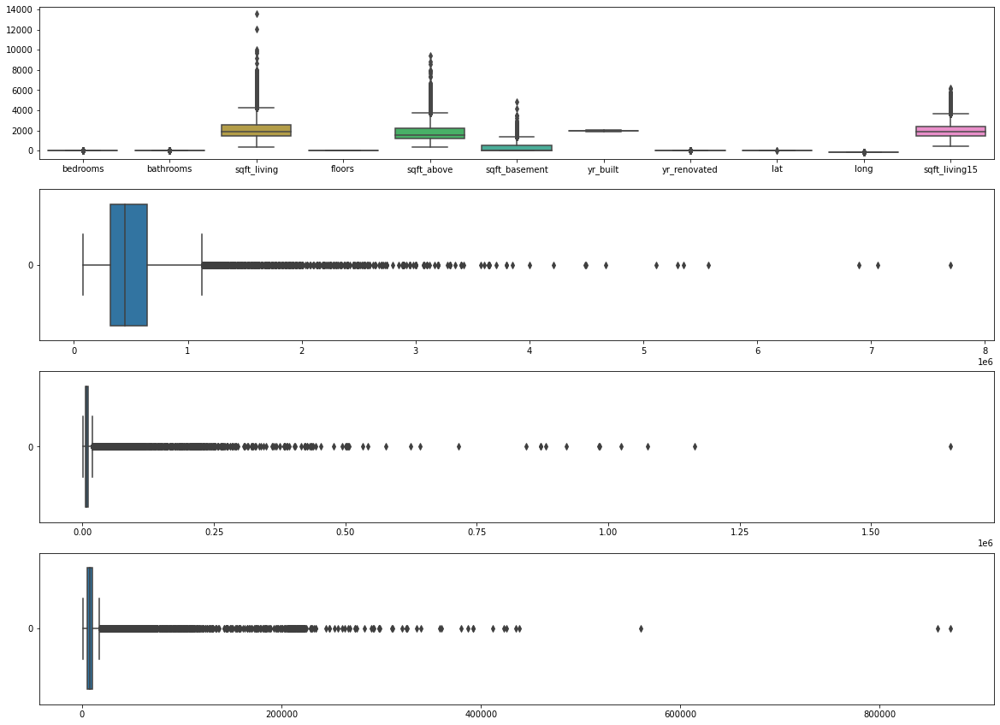

In [7]:
fig, axs = plt.subplots(4, figsize=(20,15))
sns.boxplot(data = df.drop(['price', 'zipcode', 'sqft_lot', 'sqft_lot15'], axis = 1), ax=axs[0])
sns.boxplot(data = df.price, ax=axs[1], orient = 'h')
sns.boxplot(data = df.sqft_lot, ax=axs[2], orient = 'h')
sns.boxplot(data = df.sqft_lot15, ax=axs[3], orient = 'h')

In [8]:
# I dropped all of the mansion an luxury homes because my prompt is all about the best homes to flip for profit, as any stock 
# trader will tell you: buy low and sell high

df = df[(df['grade'] != '13 Mansion') & (df['grade'] != '12 Luxury')]
df = df[df['price'] <= 2000000]
df = df[stats.zscore(df.bedrooms) < 5]
df = df[stats.zscore(df.bathrooms) < 5]
df = df[(df['long'] <= -121.7) & (df['long'] >= -122.5)]
df = df[df['lat'] >= 47.2]

# I got rid of the truely rediculous outliers by calculating the IRQ for some of the columns, however I chose to leave in some
# of my outliers because they could be good indicators for what makes a homes market price significantly different
lotiqr = df.sqft_lot.quantile(0.75) - df.sqft_lot.quantile(0.25)
df = df[df.sqft_lot <= (df.sqft_lot.quantile(0.75) + (10 * lotiqr))]

lot15iqr = df.sqft_lot15.quantile(0.75) - df.sqft_lot15.quantile(0.25)
df = df[df.sqft_lot15 <= (df.sqft_lot15.quantile(0.75) + (10 * lot15iqr))]

liviqr = df.sqft_living.quantile(0.75) - df.sqft_living.quantile(0.25)
df = df[df.sqft_living <= (df.sqft_living.quantile(0.75) + (4 * liviqr))]

abiqr = df.sqft_above.quantile(0.75) - df.sqft_above.quantile(0.25)
df = df[df.sqft_above <= (df.sqft_above.quantile(0.75) + (4 * abiqr))]

## Try to Get a Sense for the Data Relations

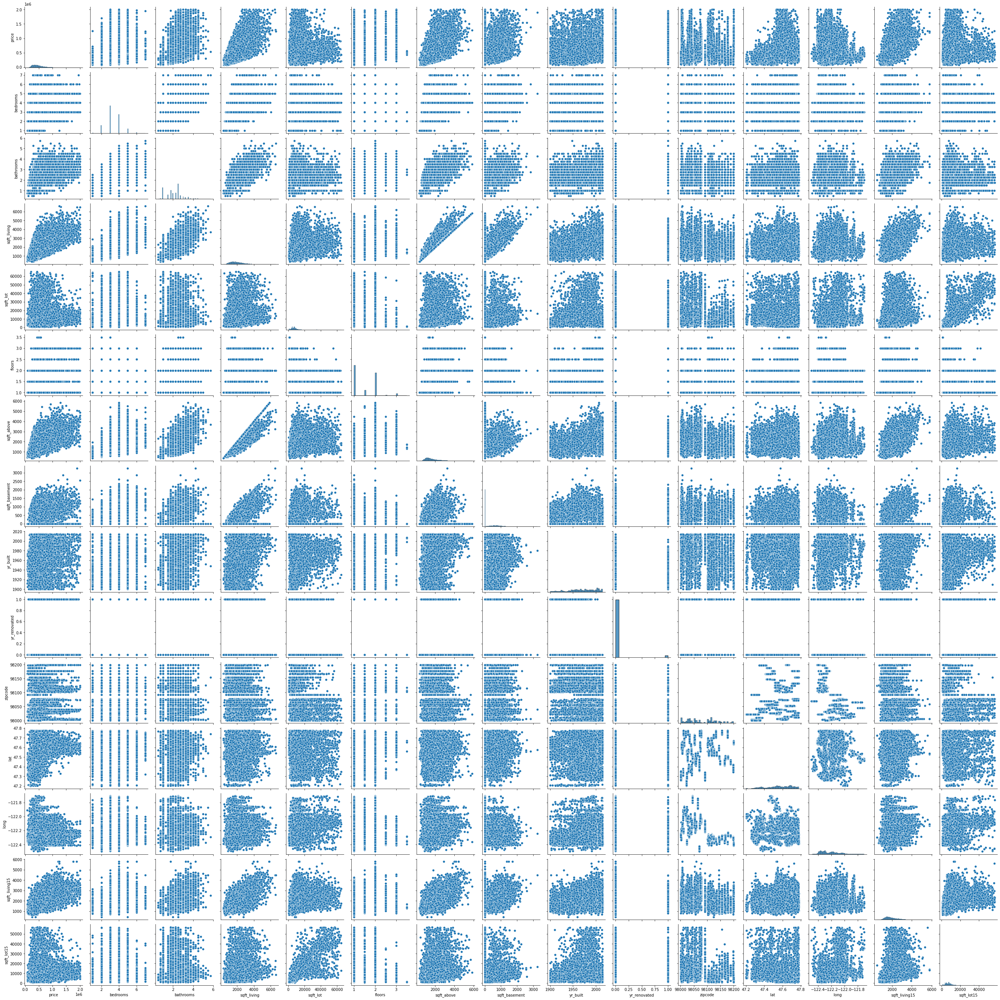

In [38]:
sns.pairplot(df)

## Baseline Linear Regression Model
For the first model I deceided to just check the relationships between the numeric housing data and the market price

In [10]:
# for the regression model you need to split up the data so that you can build the model with one part, and then test that model
# with the second part
x_all = df.drop('price', axis = 1)
x_train, x_test, y_train, y_test = train_test_split(x_all, df.price, test_size = 0.33, random_state = 42)

In [11]:
# I reset the index here because down the line it makes things much easier when we want to change the categorical variables
x_train = x_train.reset_index().drop('index', axis=1)
y_train = y_train.reset_index().drop('index', axis=1)

# dropping all of the independent variables that are not numeric
x = x_train.drop(['date', 'waterfront', 'view', 'condition', 'grade', 'zipcode'], axis = 1)
# I normalize the target variable to satisfy linear regression assumption that the distribution is normal
y = np.log(y_train)

# I scale the independent x variables because the scale is vastly different between certain variables
ss = StandardScaler()
baseline_x_scaled = ss.fit_transform(x)
baseline_x_stand = pd.DataFrame(baseline_x_scaled, columns = x.columns, index = x.index)

model = sm.OLS(y, sm.add_constant(baseline_x_stand)).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.686
Model:                            OLS   Adj. R-squared:                  0.685
Method:                 Least Squares   F-statistic:                     2295.
Date:                Mon, 31 Oct 2022   Prob (F-statistic):               0.00
Time:                        08:57:37   Log-Likelihood:                -1875.3
No. Observations:               13702   AIC:                             3779.
Df Residuals:                   13688   BIC:                             3884.
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const            13.0250      0.002   5492.186      0.000      13.020      13.030
bedrooms         -0.0345      0.003    -11.190      0.000      -0.041      -0.028
bathrooms         0.0711      0.004     16.923      0.000       0.063       0.079
sqft_living       0.2607      0.029      8.863      0.000       0.203       0.318
sqft_lot         -0.0079      0.005     -1.618      0.106      -0.017       0.002
floors            0.0519      0.003     15.045      0.000       0.045       0.059
sqft_above       -0.0477      0.027     -1.781      0.075      -0.100       0.005
sqft_basement    -0.0247      0.015     -1.652      0.099      -0.054       0.005
yr_built         -0.0945      0.003    -27.799      0.000      -0.101      -0.088
yr_renovated      0.0150      0.002      6.056      0.000       0.010       0.020
lat               0.1990      0.002     80.807      0.000       0.194       0.204
long             -0.0181      0.003     -6.283      0.000      -0.024      -0.012
sqft_living15     0.1285      0.004     33.358      0.000       0.121       0.136
sqft_lot15       -0.0075      0.005     -1.541      0.123      -0.017       0.002
==============================================================================
Omnibus:                      187.542   Durbin-Watson:                   2.013
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              346.084
Skew:                          -0.035   Prob(JB):                     7.06e-76
Kurtosis:                       3.775   Cond. No.                         37.7
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [12]:
# I reset the index here because down the line it makes things much easier when we want to change the categorical variables
x_test = x_test.reset_index().drop('index', axis=1)
y_test = y_test.reset_index().drop('index', axis=1)

# normalized the target because of the differnt scales
y_t = np.log(y_test)
# dropping all of the independent variables that are not numeric
x_t = x_test.drop(['date', 'waterfront', 'view', 'condition', 'grade', 'zipcode'], axis = 1)

# I scale the independent x variables because the scale is vastly different between certain variables
baseline_x_test_scaled = ss.transform(x_t)
baseline_x_test_stand = pd.DataFrame(baseline_x_test_scaled, columns = x_t.columns, index = x_t.index)

# calculating the predicted prices based on the model fitted on the training data
baseline_y_hat = model.predict(sm.add_constant(baseline_x_test_stand))
baseline_y_hat = np.exp(baseline_y_hat)

# calculating the raw error, the error adjusted for multicollinearity, and the rsquared
mae = mean_absolute_error(baseline_y_hat, y_test)
rmse = mean_squared_error(baseline_y_hat, y_test, squared = False)
rsquared = model.rsquared
print(mae, rmse, rsquared)

113185.4557142367 176049.535078664 0.6855261388020988


As expected the error for the baseline model is off the charts and the r squared is nothing to brag about. The rmse is significantly higher than my mae because of all of the outliers that I chose to leave in my model.

# Round One of Modeling

For this round of modeling I wanted to include the categorical variables to see if this would affect the results of my multiple
linear regression.

In [13]:
# Using OrdinalEncoder to change the categories where the values are ranked into numeric data types
cat_subset = x_train[['view', 'condition', 'grade']]
view_list = ['NONE', 'FAIR','AVERAGE', 'GOOD', 'EXCELLENT']
cond_list = ['Poor', 'Fair', 'Average', 'Good', 'Very Good']
grade_list = ['3 Poor', '4 Low', '5 Fair', '6 Low Average', '7 Average', '8 Good', '9 Better', '10 Very Good', '11 Excellent']
o_enc = OrdinalEncoder(categories = [view_list, cond_list, grade_list])
o_enc.fit(cat_subset)
x_subset = pd.DataFrame(o_enc.transform(cat_subset), columns = cat_subset.columns)
x_train[['view', 'condition', 'grade']] = x_subset

# Using OneHotEncoder to change the categories with values that don't have rankings into numeric data
onehot = OneHotEncoder(handle_unknown = 'ignore', drop = 'first', sparse = False)
temp = pd.DataFrame(onehot.fit_transform(x_train[['waterfront', 'zipcode']]), columns = onehot.get_feature_names_out())
x_train = pd.concat([x_train, temp], axis = 1)
x_train = x_train.drop(['waterfront', 'zipcode'], axis = 1)

# Changing the date to an numeric type the linear regression model can read
x_train['date'] = x_train['date'].map(dt.datetime.toordinal)

In [14]:
# I normalize the target variable to satisfy linear regression assumption that the distribution is normal
y = np.log(y_train)

# I scale the independent x variables because the scale is vastly different between certain variables
x_scaled = ss.fit_transform(x_train)
x_stand = pd.DataFrame(x_scaled, columns = x_train.columns,index = x_train.index)

model = sm.OLS(y, sm.add_constant(x_stand)).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.872
Model:                            OLS   Adj. R-squared:                  0.872
Method:                 Least Squares   F-statistic:                     1070.
Date:                Mon, 31 Oct 2022   Prob (F-statistic):               0.00
Time:                        08:57:37   Log-Likelihood:                 4307.1
No. Observations:               13702   AIC:                            -8438.
Df Residuals:                   13614   BIC:                            -7776.
Df Model:                          87                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const             13.0250      0.002   8600.484      0.000      13.022      13.028
date               0.0239      0.002     15.659      0.000       0.021       0.027
bedrooms           0.0033      0.002      1.645      0.100      -0.001       0.007
bathrooms          0.0309      0.003     11.334      0.000       0.026       0.036
sqft_living        0.0961      0.019      5.081      0.000       0.059       0.133
sqft_lot           0.0186      0.003      5.908      0.000       0.012       0.025
floors            -0.0150      0.002     -6.207      0.000      -0.020      -0.010
view               0.0448      0.002     24.870      0.000       0.041       0.048
condition          0.0398      0.002     22.818      0.000       0.036       0.043
grade              0.1012      0.003     35.375      0.000       0.096       0.107
sqft_above         0.0694      0.017      4.036      0.000       0.036       0.103
sqft_basement      0.0055      0.010      0.577      0.564      -0.013       0.024
yr_built          -0.0131      0.003     -4.923      0.000      -0.018      -0.008
yr_renovated       0.0144      0.002      8.904      0.000       0.011       0.018
lat                0.0509      0.013      4.062      0.000       0.026       0.075
long              -0.0343      0.012     -2.927      0.003      -0.057      -0.011
sqft_living15      0.0495      0.003     18.016      0.000       0.044       0.055
sqft_lot15        -0.0061      0.003     -1.877      0.061      -0.012       0.000
waterfront_YES     0.0285      0.002     17.410      0.000       0.025       0.032
zipcode_98002     -0.0020      0.002     -0.999      0.318      -0.006       0.002
zipcode_98003     -0.0014      0.002     -0.677      0.498      -0.005       0.003
zipcode_98004      0.1137      0.004     29.110      0.000       0.106       0.121
zipcode_98005      0.0560      0.003     17.300      0.000       0.050       0.062
zipcode_98006      0.0836      0.005     18.262      0.000       0.075       0.093
zipcode_98007      0.0442      0.003     14.759      0.000       0.038       0.050
zipcode_98008      0.0657      0.004     15.614      0.000       0.057       0.074
zipcode_98010      0.0202      0.002      9.264      0.000       0.016       0.024
zipcode_98011      0.0299      0.005      6.551      0.000       0.021       0.039
zipcode_98014      0.0189      0.003      6.109      0.000       0.013       0.025
zipcode_98019      0.0207      0.005      4.409      0.000       0.012       0.030
zipcode_98022      0.0080      0.002      3.350      0.001       0.003       0.013
zipcode_98023     -0.0065      0.003     -2.460      0.014      -0.012      -0.001
zipcode_98024      0.0174      0.002      7.301      0.000       0.013       0.022
zipcode_98027      0.0658      0.004     15.118      0.000       0.057       0.074
zipcode_9802

In [15]:
#transforming the testing data with the same process as the training data minus the fitting of the encoders
cat_subset_test = x_test[['view', 'condition', 'grade']]
x_test_subset = pd.DataFrame(o_enc.transform(cat_subset_test), columns = cat_subset_test.columns)
x_test[['view', 'condition', 'grade']] = x_test_subset

# this is a variable that will save the zipcode column as a categorical column for use later on in the code
save = x_test.zipcode

temp_t = pd.DataFrame(onehot.transform(x_test[['waterfront', 'zipcode']]), columns = onehot.get_feature_names_out())
x_test = pd.concat([x_test, temp_t], axis = 1)
x_test = x_test.drop(['waterfront', 'zipcode'], axis = 1)

x_test['date'] = x_test['date'].map(dt.datetime.toordinal)

In [16]:
# same process for baseline model when calculating the accuracy of the model on the test data
y_t = np.log(y_test)

x_test_scaled = ss.transform(x_test)
x_test_stand = pd.DataFrame(x_test_scaled, columns = x_test.columns, index = x_test.index)

y_hat = model.predict(sm.add_constant(x_test_stand))
y_hat = np.exp(y_hat)

mae = mean_absolute_error(y_hat, y_test)
rmse = mean_squared_error(y_hat, y_test, squared = False)
rsquared = model.rsquared
print(mae, rmse, rsquared)

67965.34263357353 109649.46189972623 0.8724516172902336


For the second model my MAE and RMSE are significantly lower thanks to the addition of the categorical variables

<AxesSubplot:xlabel='long', ylabel='lat'>

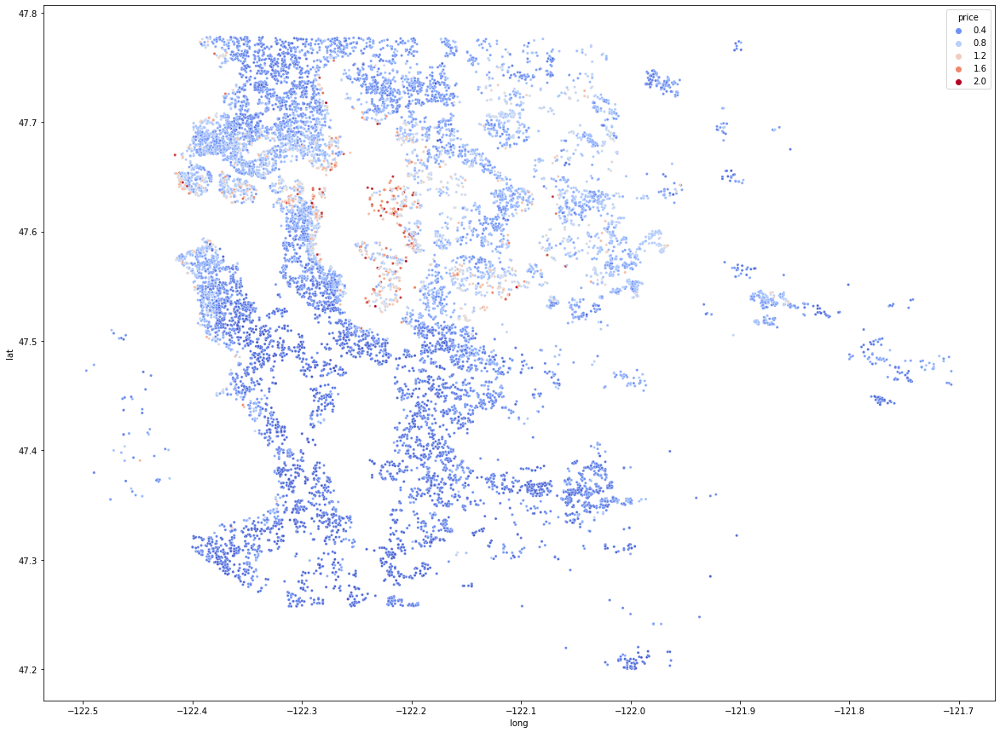

In [17]:
# I wanted to get a sence of where the mose expensive homes were so I mapped the houses using their coordinates and their
# market prices
both = pd.concat([x_train, y_train], axis=1)

fig, ax = plt.subplots(figsize = (20,15))
sns.scatterplot(data = both, x='long', y= 'lat', hue='price', s=10, ax=ax,palette = sns.color_palette("coolwarm", as_cmap=True))

# Round Two of Modeling
I started out checking for multicollinearity between the independent variables

<AxesSubplot:>

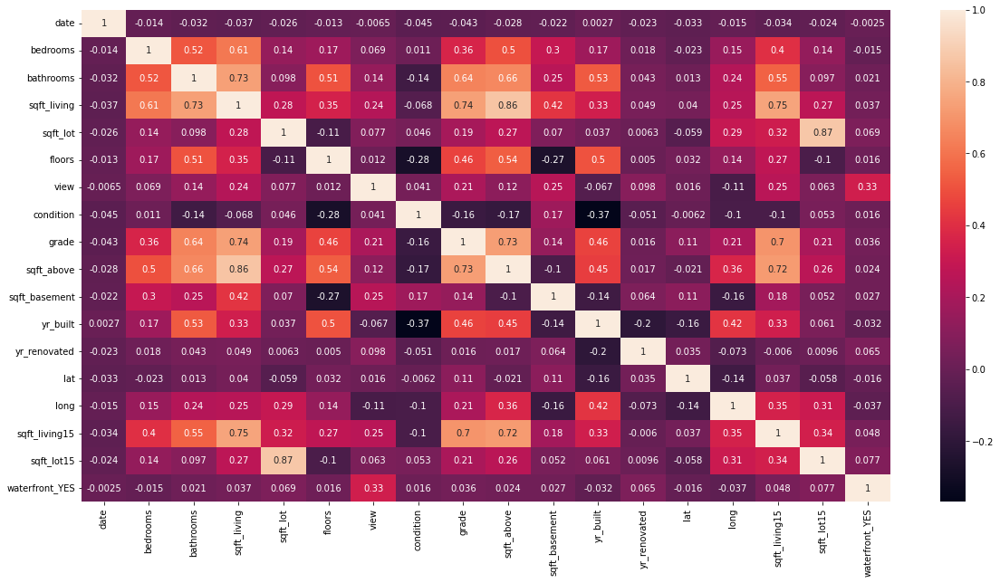

In [18]:
# I only care about mulitcollinearity between the non zipcode columns because any correlation with zipcodes could be useful data
non_zip = ['date','bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 'view', 'condition', 'grade', 'sqft_above',
           'sqft_basement', 'yr_built', 'yr_renovated', 'lat', 'long', 'sqft_living15', 'sqft_lot15', 'waterfront_YES']
fig, axs = plt.subplots(figsize=(20,10))
sns.heatmap(x_train[non_zip].corr(), ax=axs, annot=True)

In [19]:
# This is where I check for the variables with the highes correlations
cores = x_train.corr()
maxes = []
for column in cores.columns:
    current = cores[column]
    for i in range(len(cores.columns)):
        correlation = current.tolist()[i]
        if (correlation != 1) & (np.abs(correlation) >= .7):
            maxes.append((round(correlation, 4), column, current.index[i]))
maxes

[(0.734, 'bathrooms', 'sqft_living'),
 (0.734, 'sqft_living', 'bathrooms'),
 (0.7374, 'sqft_living', 'grade'),
 (0.8581, 'sqft_living', 'sqft_above'),
 (0.7506, 'sqft_living', 'sqft_living15'),
 (0.8704, 'sqft_lot', 'sqft_lot15'),
 (0.7374, 'grade', 'sqft_living'),
 (0.7282, 'grade', 'sqft_above'),
 (0.8581, 'sqft_above', 'sqft_living'),
 (0.7282, 'sqft_above', 'grade'),
 (0.7199, 'sqft_above', 'sqft_living15'),
 (0.7506, 'sqft_living15', 'sqft_living'),
 (0.7199, 'sqft_living15', 'sqft_above'),
 (0.8704, 'sqft_lot15', 'sqft_lot')]

In [20]:
# It makes sense that the sqft of the basement, above and living are highly correlated (basement+above=living)
# Dropping the individual parts makes more sense so that I can keep the total sqft of the house (sqft living)
r2_x_train = x_train

r2_x_train = r2_x_train.drop(['sqft_above', 'sqft_basement', 'sqft_lot15'], axis=1)
r2_x_train = r2_x_train.drop(['zipcode_98002','zipcode_98003','zipcode_98148','zipcode_98168',
                              'zipcode_98188', 'zipcode_98198'], axis = 1)
r2_xscaled = ss.fit_transform(r2_x_train)
r2_x_stand = pd.DataFrame(r2_xscaled, columns = r2_x_train.columns, index = r2_x_train.index)

# switching over to the sklearn linear regression is easier and allows for more percise data collection
lr = LinearRegression()
lr.fit(r2_x_stand, y)
lr.score(r2_x_stand, y)

0.8701381763047126

In [21]:
# mirroring what I did to the train data to the test data
r2_x_test = x_test

r2_x_test = r2_x_test.drop(['sqft_above', 'sqft_basement', 'sqft_lot15'], axis=1)
r2_x_test = r2_x_test.drop(['zipcode_98002','zipcode_98003','zipcode_98148','zipcode_98168',
                            'zipcode_98188', 'zipcode_98198'], axis = 1)

r2_x_test_scaled = ss.transform(r2_x_test)
r2_x_test_stand = pd.DataFrame(r2_x_test_scaled, columns = r2_x_test.columns, index = r2_x_test.index)

r2_y_hat = lr.predict(r2_x_test_stand)
r2_y_hat = np.exp(r2_y_hat)

r2_mae = mean_absolute_error(r2_y_hat, y_test)
r2_rmse = mean_squared_error(r2_y_hat, y_test, squared = False)
r2_rsquared = lr.score(r2_x_test_stand, y_t)
print(r2_mae, r2_rmse, r2_rsquared)

68638.60670955869 110700.49415518867 0.8700511603648464


For this model my error increased slightly and my rsquared decreased but it was worth it to make my model more compact and less cluttered with independent variables.

# Round Three of Modeling
For this round I wanted to add in a few other datasets from the same Open Data website that I got the housing info from. This was all about checking each houses proximity to things such as: major cities, parks, restaurants, and hospitals. All of this is in the hope that it can increase my rsquared score

In [22]:
# this is where I get the coordinates for each house
cords = list(zip(r2_x_train.lat.tolist(), r2_x_train.long.tolist()))

# reading in the data for each restaurant in King County
food_df = pd.read_csv('./data/Food_Establishment_Inspection_Data.csv')
# getting only the restaurants that were open around the time of our housing data
food_df = food_df[food_df['Inspection Closed Business'] == False]
food_df = food_df[['Name', 'Business_ID', 'Inspection Date', 'Zip Code', 'Longitude', 'Latitude', 'Inspection Score', 'Grade']]
food_df['Inspection Date'] = pd.to_datetime(food_df['Inspection Date'])
food_df = food_df[(food_df['Inspection Date'] >= '01-01-2012') & (food_df['Inspection Date'] <= '01-01-2017')]
food_df = food_df.sort_values(['Name', 'Inspection Date'], ascending= [True, False])
food_df = food_df.drop_duplicates(subset=['Longitude', 'Latitude'], keep = 'first')
food_df['Grade'] = food_df.Grade.fillna(0).replace('N',0, regex=True).astype('int64')
food_df.dropna(inplace=True)
# getting the actual coordinates of each restaurant
rests = list(zip(food_df['Latitude'].round(4).tolist(), food_df['Longitude'].round(4).tolist()))
# getting the coordinates of each hospital and medical center
medical_df = pd.read_csv('./data/Medical_Facilities_including_Hospitals___medical_facilities_point.csv')
meds = list(zip(medical_df['Y'].round(4).tolist(), medical_df['X'].round(4).tolist()))
# getting the coordinates of each park
parks_df = pd.read_csv('./data/Park_Label_Points___park_label_point.csv')
parks = list(zip(parks_df['Y'].round(4).tolist(), parks_df['X'].round(4).tolist()))

mile2 = 0.0429
d_to_city = []
rest_in_range = []
closest_medical = []
parks_in_range = []

for cord in cords:
    # calculating the distance to the closes major city
    d_seattle = np.abs(cord[0] - 47.6062) + np.abs(cord[1] - -122.3321)
    d_bellevue = np.abs(cord[0] - 47.6101) + np.abs(cord[1] - -122.2015)
    ds = [d_seattle, d_bellevue]
    d_to_city.append(max(ds))
    
    # number of restaurants in a two mile radius
    in_range = []
    for rest in rests:
        if (np.abs(cord[0] - rest[0]) + np.abs(cord[1] - rest[1])) <= mile2:
            in_range.append(rest)
    rest_in_range.append(len(in_range))
    
    # distance to the closest medical center
    distances = []
    for med in meds:
        distances.append(round(np.abs(cord[0] - med[0]) + np.abs(cord[1] - med[1]), 4))
    closest_medical.append(min(distances))
    
    # number of parks in a two mile radius
    p_in_range = []
    for park in parks:
        if (np.abs(cord[0] - park[0]) + np.abs(cord[1] - park[1])) <= mile2:
            p_in_range.append(park)
    parks_in_range.append(len(p_in_range))

C:\Users\jackl\AppData\Local\Temp\ipykernel_29056\124242388.py:5: DtypeWarning: Columns (6,21) have mixed types. Specify dtype option on import or set low_memory=False.
  food_df = pd.read_csv('./data/Food_Establishment_Inspection_Data.csv')


In [23]:
# this is where I create a new dataframe with the new columns
r3_x_train = r2_x_train
r3_x_train['food'] = rest_in_range
r3_x_train['medical'] = closest_medical
r3_x_train['parks'] = parks_in_range
r3_x_train['city_distance'] = d_to_city

In [24]:
# this new model with the added information, calculated the same way as the previous model
r3_xscaled = ss.fit_transform(r3_x_train)
r3_x_stand = pd.DataFrame(r3_xscaled, columns = r3_x_train.columns, index = r3_x_train.index)

lr.fit(r3_x_stand, y)
r3_score = lr.score(r3_x_stand, y)
print(r3_score)

0.8716766380881544


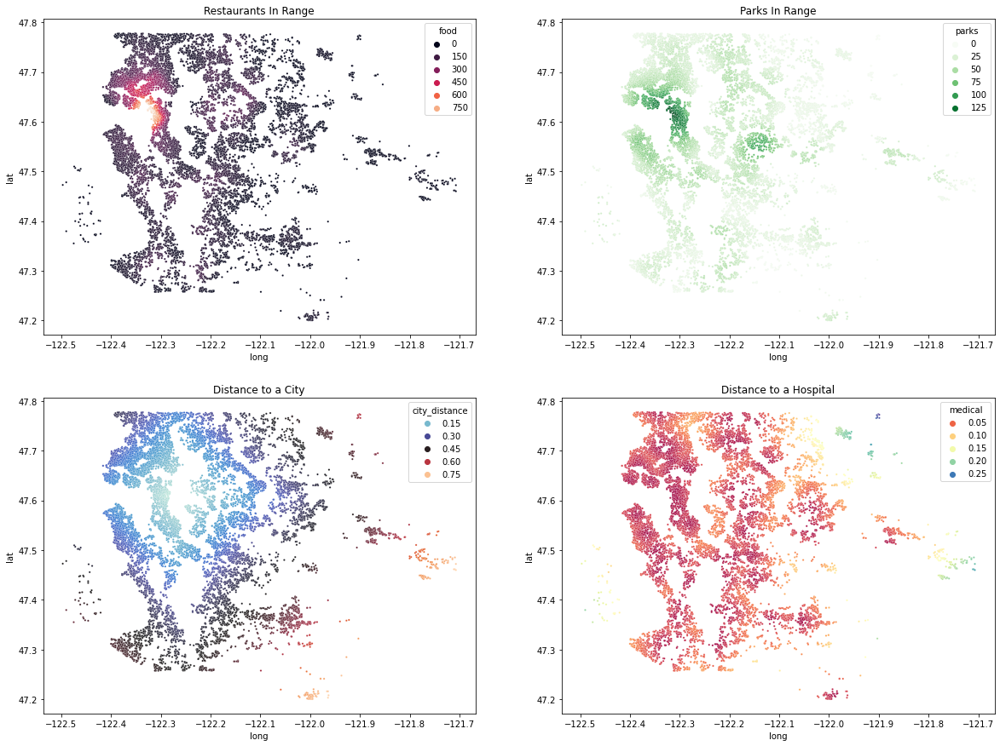

In [25]:
# this grid plot of graphs will show the distribution of the various parks, cities, hospitals, and restaurants
rest_color = sns.color_palette('rocket', as_cmap=True)
park_color = sns.color_palette('Greens', as_cmap=True)
city_color = sns.color_palette("icefire",as_cmap=True)
med_color = sns.color_palette('Spectral', as_cmap=True)


fig, axs = plt.subplots(2,2, figsize = (20,15))
sns.scatterplot(data = r3_x_train, x='long', y = 'lat', hue = 'food', s=5, ax = axs[0,0], palette = rest_color)
axs[0,0].set_title('Restaurants In Range')
sns.scatterplot(data = r3_x_train, x='long', y = 'lat', hue = 'parks', s=5, ax = axs[0,1], palette = park_color)
axs[0,1].set_title('Parks In Range')
sns.scatterplot(data = r3_x_train, x='long', y = 'lat', hue = 'city_distance', s=5,ax = axs[1,0], palette = city_color)
axs[1,0].set_title('Distance to a City')
sns.scatterplot(data = r3_x_train, x='long', y = 'lat', hue = 'medical', s=5, ax = axs[1,1], palette = med_color)
axs[1,1].set_title('Distance to a Hospital')
plt.show()

In [26]:
# repeate the same process for the testing data 
test_cords = list(zip(r2_x_test.lat.tolist(), r2_x_test.long.tolist()))
d_to_city_test = []
rest_in_range_test = []
closest_medical_test = []
parks_in_range_test = []

for cord in test_cords:
    d_seattle = np.abs(cord[0] - 47.6062) + np.abs(cord[1] - -122.3321)
    d_bellevue = np.abs(cord[0] - 47.6101) + np.abs(cord[1] - -122.2015)
    ds = [d_seattle, d_bellevue]
    d_to_city_test.append(max(ds))
    
    in_range = []
    for rest in rests:
        if (np.abs(cord[0] - rest[0]) + np.abs(cord[1] - rest[1])) <= mile2:
            in_range.append(rest)
    rest_in_range_test.append(len(in_range))
    
    distances = []
    for med in meds:
        distances.append(round(np.abs(cord[0] - med[0]) + np.abs(cord[1] - med[1]), 4))
    closest_medical_test.append(min(distances))
    
    p_in_range = []
    for park in parks:
        if (np.abs(cord[0] - park[0]) + np.abs(cord[1] - park[1])) <= mile2:
            p_in_range.append(park)
    parks_in_range_test.append(len(p_in_range))

In [27]:
# the new testing data frame
r3_x_test = r2_x_test
r3_x_test['food'] = rest_in_range_test
r3_x_test['medical'] = closest_medical_test
r3_x_test['parks'] = parks_in_range_test
r3_x_test['city_distance'] = d_to_city_test

In [28]:
# the new testing model with the measures of error
r3_x_test_scaled = ss.transform(r3_x_test)
r3_x_test_stand = pd.DataFrame(r3_x_test_scaled, columns = r3_x_test.columns, index = r3_x_test.index)

r3_y_hat = lr.predict(r3_x_test_stand)
r3_y_hat = np.exp(r3_y_hat)
r3_y_hat = [item for sub in r3_y_hat for item in sub]

r3_mae = mean_absolute_error(r3_y_hat, y_test)
r3_rmse = mean_squared_error(r3_y_hat, y_test, squared = False)
r3_rsquared = lr.score(r3_x_test_stand, y_t)
print(r3_mae, r3_rmse, r3_rsquared)

67975.94906043289 108990.1674063011 0.8714173790551331


Now with the added locational data my rsquared and error are roughly back to the levels they were at in the first full model, however, now this model is filled with much more relavent data columns.

In [29]:
# this graph is used to visualize the amount of error for our model based on the residuals of the latest model
import plotly.express as px
px.scatter(x = r3_y_hat, y = y_test.price, trendline = 'ols', title = 'expected vs actual house price')

# Round Four of Modeling
This round of modeling was designed to check the interactions of each pair of independent variables. I then looked through the list of interactions and chose the ones that had the most impact and made the most sense in context.

In [30]:
# I could have done all the possible combinations with a few for loops, but it's much easier to use the PolynomialFeatures mod
poly = PolynomialFeatures(interaction_only=True, include_bias = False)
poly_df = pd.DataFrame(poly.fit_transform(r3_x_train), columns = poly.get_feature_names_out())

poly_scaled = ss.fit_transform(poly_df)
poly_stand = pd.DataFrame(poly_scaled, columns = poly_df.columns, index = poly_df.index)

lr.fit(poly_stand, y)
lr.score(poly_stand, y)

0.9181541167762202

Thanks the the countless combinations the r squared is significantly higher

In [31]:
poly_test_df = pd.DataFrame(poly.transform(r3_x_test), columns = poly.get_feature_names_out())

poly_test_scaled = ss.transform(poly_test_df)
poly_test_stand = pd.DataFrame(poly_test_scaled, columns = poly_test_df.columns, index = poly_test_df.index)

poly_y_hat = lr.predict(poly_test_stand)
poly_y_hat = np.exp(poly_y_hat)

lr.score(poly_test_stand, y_t)

C:\Users\jackl\AppData\Local\Temp\ipykernel_29056\2559228601.py:7: RuntimeWarning:

overflow encountered in exp



-854841004442.604

This messed up r squared comes from the fact that with a few hundred potential columns in the training fit of the poly object, its impossible to expect the same number of columns from the test data with is much smaller than the train data.

In [32]:
# Here I find out a few of the most important correlations in the polynomial feature model
poly_dict = dict(zip(poly_df.columns, lr.coef_[0]))
temp_df = pd.DataFrame()
temp_df['name'] = poly_dict.keys()
temp_df['coefs'] = poly_dict.values()
steve = temp_df.sort_values(['coefs'], ascending=False)
steve[~steve['name'].str.contains('zip')].head(10)

,name,coefs
93,date long,120.495329
9,yr_built,58.949636
984,lat food,53.219437
8,grade,52.254265
777,yr_built long,46.936967
161,date parks,42.389631
95,date waterfront_YES,42.251877
7,condition,35.560231
985,lat medical,33.347151
988,long sqft_living15,30.277784


## Final Model
The final model with everything I have done so far incorporated. Added to this are the interactions that proved to have the biggest affects on the model's accuracy

In [33]:
# this is the final model
final_x_train = r3_x_train
final_x_train['overall level'] = final_x_train.condition * final_x_train.grade
final_x_train['living'] = final_x_train.sqft_living * final_x_train.sqft_living15
final_x_train['food vs parks'] = final_x_train.food * final_x_train.parks

final_xscaled = ss.fit_transform(final_x_train)
final_x_stand = pd.DataFrame(final_xscaled, columns = final_x_train.columns, index = final_x_train.index)

lr.fit(final_x_stand, y)
final_score = lr.score(final_x_stand, y)
print(r3_score)

0.8716766380881544


In [34]:
final_x_test = r3_x_test
final_x_test['overall level'] = final_x_test.condition * final_x_test.grade
final_x_test['living'] = final_x_test.sqft_living * final_x_test.sqft_living15
final_x_test['food vs parks'] = final_x_test.food * final_x_test.parks

final_x_test_scaled = ss.transform(final_x_test)
final_x_test_stand = pd.DataFrame(final_x_test_scaled, columns = final_x_test.columns, index = final_x_test.index)

final_y_hat = lr.predict(final_x_test_stand)
final_y_hat = np.exp(final_y_hat)
final_y_hat = [item for sub in final_y_hat for item in sub]

final_mae = mean_absolute_error(final_y_hat, y_test)
final_rmse = mean_squared_error(final_y_hat, y_test, squared = False)
final_rsquared = lr.score(final_x_test_stand, y_t)
print(final_mae, final_rmse, final_rsquared)

65615.57453051627 103300.28717806503 0.876197815839581


# Interperating the Results

In [35]:
flip = pd.DataFrame()
flip['difference'] = final_y_hat - y_test.price
flip['zip'] = save
flip['price'] = y_test
flip = flip[(flip['price'] >= 300000) & (flip['price'] <= 1200000)]
underrated = flip.groupby('zip').sum()['difference'].sort_values(ascending = False).head()
underrated

zip
98004    3.545720e+06
98008    2.266908e+06
98040    2.041760e+06
98105    1.569039e+06
98006    1.315924e+06
Name: difference, dtype: float64

# Finding out what to do specifically 

In [36]:
stand_coefs = dict(zip(final_x_train.columns, lr.coef_[0]))
coef_df = pd.DataFrame()
coef_df['stand_coef'] = stand_coefs.values()
coef_df['variable'] = stand_coefs.keys()

tl = LinearRegression()
tl.fit(final_x_train, y_train)
unstand_coefs = dict(zip(final_x_train.columns, tl.coef_[0]))
coef_df['unstand_coef'] = unstand_coefs.values()

coef_df.sort_values('stand_coef', inplace = True, ascending = False)
coef_df[~coef_df['variable'].str.contains('zip')]

,stand_coef,variable,unstand_coef
3,0.245400,sqft_living,73.056937
8,0.144289,grade,52146.254651
13,0.136254,sqft_living15,-25.098534
7,0.074700,condition,12016.452282
6,0.041411,view,47660.647037
14,0.028173,waterfront_YES,380516.317627
0,0.023847,date,107.331276
80,0.019124,parks,438.765028
2,0.018410,bathrooms,16479.349387
12,0.018170,long,244561.310520


In [37]:
nozip = [name for name in r3_x_test.columns if 'zip' not in name]
narrow_df = r3_x_test[nozip]
narrow_df['zip'] = save

C:\Users\jackl\AppData\Local\Temp\ipykernel_29056\108675548.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



## Conclusions
Based on the coefficients of my model, a house flipping business would want a house:
- **On or around the beach**
- **In one of the five zipcodes**
- **With an unobstructed view of the water or some other sight**
- **that has plenty of space to expand the house**
- **As close to the city as possible**


## Next Steps
- I would want a larger dataset of houses to bolster the accuracy of the model
- More recent data 
- I would conduct a seperate analysis for the affects of COVID on the housing market
- I might need a dataset for the school districts to incorporate into the model
- Other transportational data such as highway access, trains, busses stops, airports, etc.